In [ ]:
# --- 路径修复：notebook 在 Base/ 下，数据在 Data/ 下 ---
import os as _os, sys as _sys
if _os.path.basename(_os.getcwd()) == 'Base':
    _os.chdir('..')
if 'Base' not in _sys.path:
    _sys.path.insert(0, 'Base')

def _find(path):
    """自动检测 Data/ 子目录前缀。"""
    if _os.path.exists(path):
        return path
    alt = _os.path.join('Data', path)
    if _os.path.exists(alt):
        return alt
    return path


In [3]:
import numpy as np
import math
import fits
import astropy.io.fits as afits
import matplotlib.pyplot as plt


## Data filtering

In [4]:
star_hdus = afits.open('Data/dr12_v1.1_LRS_stellar.fits.gz') 

In [5]:
star = star_hdus[1].data
star

FITS_rec([(    101001, 'G12763466510210', 2676862492063809792, 'J220848.54-020324.3', '2011-10-24', 55859, 55858, 'F5902',  1,   1, 332.202274 , -2.056767 , 0.7 , 12.22, 27.16, 36.14, 21.07, 'STAR', 'G7', -1.386960e-04, 2.40833e-05, 105533322022392349,   17.0423,   16.4241, 16.163 ,   16.0409,   15.9549, '2676862492063809792', 16.477673, 'Obj', 0, 0., 332.202274 , -2.056767 , 5178.32, 106.85, 4.545, 0.178, -0.497, 0.116,  -41.58, 7.22, -9.99900e+03, -9.9990e+03, -9999.),
          (    101005, 'G12763553667654', 2676108501965287552, 'J221008.50-020659.1', '2011-10-24', 55859, 55858, 'F5902',  1,   5, 332.535456 , -2.116436 , 0.71,  8.08, 16.76, 23.27, 12.09, 'STAR', 'G0', -2.506401e-04, 2.52508e-05, 105463325350400242, -999.    , -999.    , 21.3976, -999.    , -999.    , '2676108501965287552', 17.017109, 'Obj', 0, 0., 332.535456 , -2.116436 , 5314.64, 125.09, 3.722, 0.21 , -0.737, 0.137,  -75.14, 7.57, -9.99900e+03, -9.9990e+03, -9999.),
          (    101008, 'G12763564851128', 267686

In [30]:
star.dtype.names

('obsid',
 'uid',
 'gp_id',
 'designation',
 'obsdate',
 'lmjd',
 'mjd',
 'planid',
 'spid',
 'fiberid',
 'ra_obs',
 'dec_obs',
 'snru',
 'snrg',
 'snrr',
 'snri',
 'snrz',
 'class',
 'subclass',
 'z',
 'z_err',
 'ps_id',
 'mag_ps_g',
 'mag_ps_r',
 'mag_ps_i',
 'mag_ps_z',
 'mag_ps_y',
 'gaia_source_id',
 'gaia_g_mean_mag',
 'fibertype',
 'offsets',
 'offsets_v',
 'ra',
 'dec',
 'teff',
 'teff_err',
 'logg',
 'logg_err',
 'feh',
 'feh_err',
 'rv',
 'rv_err',
 'alpha_m',
 'alpha_m_err',
 'vsini_lasp')

In [31]:
print(f"总恒星数量: {len(star)}")

总恒星数量: 8377811


In [32]:
#  应用筛选条件
mask = (
    (star['teff'] > 4000) & (star['teff'] < 5500) &  # 条件1：有效温度
    (star['logg'] < 3.0) &                           # 条件2：表面重力
    (star['feh'] > -1.8) & (star['feh'] < -1.0) &   # 条件3：金属丰度
    (star['snru'] > 5.0)                            # 条件4：u波段信噪比
)

# 3. 应用筛选条件
selected_stars = star[mask]


In [33]:
print(f"筛选后恒星数量: {len(selected_stars)}")
print(f"筛选比例: {len(selected_stars)/len(star)*100:.2f}%")

筛选后恒星数量: 22188
筛选比例: 0.26%


In [35]:
import pandas as pd
df = pd.DataFrame({
    'ra': selected_stars['ra'],
    'dec': selected_stars['dec'],
})

# 保存CSV
df.to_csv(_os.path.join('Data', 'stars.csv'), index=False)


## Data acquisition 数据获取

In [6]:
import os
import requests
import time
import re
from concurrent.futures import ThreadPoolExecutor, as_completed

def download_single_file(url, output_dir, file_index, total_files, retry_count=3):
    """下载单个文件（线程安全的函数）"""
    # 检查文件是否已存在（先临时用URL解析的文件名做预判，后续会替换）
    temp_file_id = url.split('/')[-1].split('?')[0]
    temp_filepath = os.path.join(output_dir, temp_file_id)
    if os.path.exists(temp_filepath):
        return True, temp_file_id, "已存在"

    # 尝试下载
    for attempt in range(retry_count):
        try:
            response = requests.get(url, timeout=60)
            response.raise_for_status()

            # 从响应头获取原始文件名（核心修复）
            filename = None
            if 'Content-Disposition' in response.headers:
                content_disposition = response.headers['Content-Disposition']
                # 解析 filename*=UTF-8''xxx 或 filename="xxx" 格式
                match = re.search(r'filename\*?=([^;]+)', content_disposition)
                if match:
                    filename_encoded = match.group(1).strip()
                    if filename_encoded.startswith("UTF-8''"):
                        filename = filename_encoded[7:]  # 处理UTF-8编码的文件名
                    else:
                        filename = filename_encoded.strip('"')  # 处理普通带引号的文件名

            # 如果响应头没有文件名， fallback 到URL解析
            if not filename:
                filename = url.split('/')[-1].split('?')[0]

            filepath = os.path.join(output_dir, filename)

            # 保存文件
            with open(filepath, 'wb') as f:
                f.write(response.content)

            file_size = len(response.content) / 1024  # KB
            return True, filename, f"成功 ({file_size:.1f} KB)"

        except Exception as e:
            if attempt < retry_count - 1:
                time.sleep(1)
            else:
                return False, temp_file_id, f"失败: {str(e)[:50]}"

    return False, temp_file_id, "重试次数用尽"

# 以下是原代码的其他部分，无需修改
def multi_thread_download():
    with open('20260203232234.txt', 'r', encoding='utf-8') as f:
        lines = f.readlines()

    output_dir = "lamost_spectra"
    os.makedirs(output_dir, exist_ok=True)

    urls = []
    for line in lines:
        line = line.strip()
        if not line or line.startswith('#') or line.startswith('wget'):
            continue
        if line.startswith('http'):
            urls.append(line)

    total = len(urls)
    print(f"找到 {total} 个下载链接")
    print(f"开始多线程下载 (最大线程数: 5)")

    success_count = 0
    failed_count = 0
    skipped_count = 0
    downloaded_files = []

    with ThreadPoolExecutor(max_workers=5) as executor:
        future_to_url = {}
        for i, url in enumerate(urls, 1):
            future = executor.submit(download_single_file, url, output_dir, i, total)
            future_to_url[future] = (url, i)

        completed = 0
        for future in as_completed(future_to_url):
            url, index = future_to_url[future]
            completed += 1

            try:
                success, filename, message = future.result()

                if message == "已存在":
                    skipped_count += 1
                    status = "跳过"
                elif success:
                    success_count += 1
                    downloaded_files.append(filename)
                    status = "成功"
                else:
                    failed_count += 1
                    status = "失败"

                progress = (completed / total) * 100
                print(f"[{completed}/{total}] {status}: {filename} - {message}")
                print(f"总进度: {progress:.1f}%")

                if not success and message != "已存在":
                    with open(os.path.join(output_dir, 'failed.txt'), 'a') as f:
                        f.write(f"{url}\n")

            except Exception as e:
                failed_count += 1
                print(f"[{index}/{total}] 异常: {str(e)[:50]}")
                with open(os.path.join(output_dir, 'failed.txt'), 'a') as f:
                    f.write(f"{url}\n")

    print("\n" + "="*50)
    print(f"下载完成!")
    print(f"总计: {total}")
    print(f"成功: {success_count}")
    print(f"失败: {failed_count}")
    print(f"跳过: {skipped_count}")

    if failed_count > 0:
        print(f"失败的URL已保存到: {os.path.join(output_dir, 'failed.txt')}")

    with open(os.path.join(output_dir, 'downloaded_files.txt'), 'w') as f:
        for file in downloaded_files:
            f.write(f"{file}\n")

if __name__ == "__main__":
    start_time = time.time()
    multi_thread_download()
    end_time = time.time()
    total_time = end_time - start_time
    minutes = int(total_time // 60)
    seconds = int(total_time % 60)
    print(f"总耗时: {minutes}分{seconds}秒")

找到 18341 个下载链接
开始多线程下载 (最大线程数: 5)
[1/18341] 成功: spec-55859-F5902_sp10-123.fits.gz - 成功 (56.8 KB)
总进度: 0.0%
[2/18341] 成功: spec-55859-F5907_sp14-096.fits.gz - 成功 (56.6 KB)
总进度: 0.0%
[3/18341] 成功: spec-55862-B6202_sp10-166.fits.gz - 成功 (56.7 KB)
总进度: 0.0%
[4/18341] 成功: spec-55859-F5907_sp03-160.fits.gz - 成功 (56.9 KB)
总进度: 0.0%
[5/18341] 成功: spec-55860-B6001_sp03-215.fits.gz - 成功 (56.7 KB)
总进度: 0.0%
[6/18341] 成功: spec-55862-B6202_sp16-231.fits.gz - 成功 (56.7 KB)
总进度: 0.0%
[7/18341] 成功: spec-55874-GAC_122N29_B1_sp01-145.fits.gz - 成功 (56.1 KB)
总进度: 0.0%
[8/18341] 成功: spec-55863-GAC_060N28_B1_sp02-165.fits.gz - 成功 (56.5 KB)
总进度: 0.0%
[9/18341] 成功: spec-55863-B6302_sp02-101.fits.gz - 成功 (56.7 KB)
总进度: 0.0%
[10/18341] 成功: spec-55874-B7401_sp16-186.fits.gz - 成功 (56.1 KB)
总进度: 0.1%
[11/18341] 成功: spec-55874-M31_012N38_B1_sp12-117.fits.gz - 成功 (55.9 KB)
总进度: 0.1%
[12/18341] 成功: spec-55880-B8001_1_sp02-135.fits.gz - 成功 (56.5 KB)
总进度: 0.1%
[13/18341] 成功: spec-55880-B8001_2_sp02-063.fits.gz - 成功 (56.4

In [9]:
import pandas as pd
# 读取CSV文件
df = pd.read_csv(_find('allstar.csv'))

# 1. 查看基本信息
print("基本信息")
print(f"数据形状: {df.shape[0]} 行 × {df.shape[1]} 列")

# 2. 查看列名
print("所有列名")
for i, col in enumerate(df.columns):
    print(f"{i+1:3d}. {col}")



基本信息
数据形状: 22188 行 × 21 列
所有列名
  1. inputobjs_dist_arcsec
  2. inputobjs_input_line
  3. inputobjs_input_ra
  4. inputobjs_input_dec
  5. combined_obsid
  6. combined_uid
  7. combined_obsdate
  8. combined_lmjd
  9. combined_mjd
 10. combined_planid
 11. combined_spid
 12. combined_fiberid
 13. combined_class
 14. combined_subclass
 15. combined_z
 16. combined_ra
 17. combined_dec
 18. combined_feh
 19. combined_rv
 20. combined_logg
 21. combined_teff


In [10]:
# 查看前几行数据
print(df.head())
print(df.dtypes)

   inputobjs_dist_arcsec  inputobjs_input_line  inputobjs_input_ra  \
0                    0.0                     2          329.910920   
1                    0.0                     3           44.362084   
2                    0.0                     4           43.616908   
3                    0.0                     5          331.571233   
4                    0.0                     6          351.584698   

   inputobjs_input_dec  combined_obsid     combined_uid combined_obsdate  \
0            -0.015970          110123  G12754327005063       2011-10-24   
1            -0.496867          203160   G8933757764697       2011-10-24   
2            -0.013752          214096   G8933599339080       2011-10-24   
3            30.928211          603215  G14192922233345       2011-10-25   
4            30.507423          710166  G13330291818997       2011-10-27   

   combined_lmjd  combined_mjd combined_planid  ...  combined_fiberid  \
0          55859         55858           F5902  .

In [15]:
# 最简单的转换方法
import pandas as pd
from astropy.table import Table

# 读取CSV
df = pd.read_csv(_find('allstar.csv'))
print(f"读取CSV: {df.shape[0]}行, {df.shape[1]}列")

# 转换并保存
table = Table.from_pandas(df)
table.write(_os.path.join('Data', 'allstar.fits'), format='fits', overwrite=True)

print(f"已保存FITS文件: allstar.fits")

# 验证
table_read = Table.read(_find('allstar.fits'), format='fits')
print(f"验证: {len(table_read)}行, {len(table_read.columns)}列")
print(f"列名: {table_read.colnames[:10]}...")  # 显示前10个列名

读取CSV: 22188行, 21列
已保存FITS文件: allstar.fits
验证: 22188行, 21列
列名: ['inputobjs_dist_arcsec', 'inputobjs_input_line', 'inputobjs_input_ra', 'inputobjs_input_dec', 'combined_obsid', 'combined_uid', 'combined_obsdate', 'combined_lmjd', 'combined_mjd', 'combined_planid']...


In [21]:
# 打开FITS文件
star_hdus = afits.open(_find('alldrnoduplicate.fits'))

# 提取数据
star = star_hdus[1].data

print(f"成功读取FITS文件")
print(f"数据行数: {len(star)}")
print(f"数据列数: {len(star.dtype.names)}")

# 显示前几个星的信息
print("\n前5个星的信息:")
for i in range(min(5, len(star))):
    # 注意：列名可能需要根据实际调整
    lmjd = star[i]['combined_lmjd'] if 'combined_lmjd' in star.dtype.names else 'N/A'
    planid = star[i]['combined_planid'] if 'combined_planid' in star.dtype.names else 'N/A'
    rv = star[i]['combined_rv'] if 'combined_rv' in star.dtype.names else 'N/A'
    
    print(f"星{i+1}: LMJD={lmjd}, PlanID={planid}, RV={rv}")

star_hdus.close()

成功读取FITS文件
数据行数: 22188
数据列数: 21

前5个星的信息:
星1: LMJD=55859, PlanID=F5902, RV=19.55
星2: LMJD=55859, PlanID=F5907, RV=28.04
星3: LMJD=55859, PlanID=F5907, RV=112.97
星4: LMJD=55860, PlanID=B6001, RV=-221.68
星5: LMJD=55862, PlanID=B6202, RV=-248.39


In [37]:
# 快速诊断脚本
import os
import astropy.io.fits as afits

path = _find('lamost_spectra') + '/'
star_hdus = afits.open(_find('allstar.fits'))
star = star_hdus[1].data

# 检查第一个星的文件
i = 0
filename = f"spec-{star['combined_lmjd'][i]}-{star['combined_planid'][i]}_sp{str(star['combined_spid'][i]).zfill(2)}-{str(star['combined_fiberid'][i]).zfill(3)}.fits.gz"
full_path = path + filename

print(f"检查文件: {full_path}")
print(f"文件存在: {os.path.exists(full_path)}")

if os.path.exists(full_path):
    # 尝试打开
    hdul = afits.open(full_path)
    print(f"HDU数量: {len(hdul)}")
    
    for j, hdu in enumerate(hdul):
        print(f"HDU {j}:")
        print(f"  类型: {type(hdu)}")
        print(f"  数据: {hdu.data}")
        if hdu.data is not None:
            print(f"  形状: {hdu.data.shape}")
            print(f"  数据类型: {hdu.data.dtype}")
    hdul.close()

检查文件: ./lamost_spectra/spec-55859-F5902_sp10-123.fits.gz
文件存在: True
HDU数量: 2
HDU 0:
  类型: <class 'astropy.io.fits.hdu.image.PrimaryHDU'>
  数据: None
HDU 1:
  类型: <class 'astropy.io.fits.hdu.table.BinTableHDU'>
  数据: [([ 4275.022  ,  4541.312  ,  4408.8203 , ...,  7049.5493 ,  7026.7334 ,  7071.853  ], [9.31959439e-05, 9.03313121e-05, 9.11590905e-05, ..., 2.16974923e-03, 2.15113023e-03, 2.12971005e-03], [3699.9863, 3700.8384, 3701.6907, ..., 9094.945 , 9097.04  , 9099.135 ], [0., 0., 0., ..., 0., 0., 0.], [0., 0., 0., ..., 0., 0., 0.], [1.        , 1.        , 1.        , ..., 1.        , 1.        , 1.        ])]
  形状: (1,)
  数据类型: (numpy.record, [('FLUX', '>f4', (3909,)), ('IVAR', '>f4', (3909,)), ('WAVELENGTH', '>f4', (3909,)), ('ANDMASK', '>f4', (3909,)), ('ORMASK', '>f4', (3909,)), ('NORMALIZATION', '>f4', (3909,))])


In [1]:
import os

def count_files_in_folder(folder_path):
    """
    统计指定文件夹中直接包含的文件数量（不包括子文件夹）。
    """
    try:
        # 获取文件夹中所有条目
        entries = os.listdir(folder_path)
        
        # 过滤出文件（排除子文件夹）
        files = [f for f in entries if os.path.isfile(os.path.join(folder_path, f))]
        
        count = len(files)
        print(f"文件夹 '{folder_path}' 中的文件数量为：{count}")
        return count
    except FileNotFoundError:
        print(f"错误：文件夹 '{folder_path}' 不存在。")
    except PermissionError:
        print(f"错误：没有权限访问文件夹 '{folder_path}'。")
    return count

# 使用示例
folder = _find("lamost_spectra")  # 替换为你的文件夹路径
count=count_files_in_folder(folder)
print(count)

文件夹 './lamost_spectra' 中的文件数量为：18342
18342


# 光谱数据处理

In [2]:
import numpy as np
import math
#import fits
import astropy.io.fits as afits#从Astropy库导入FITS文件处理模块并命名为afits。Astropy是天文学专用的Python库，此模块专门用于读写和处理FITS (Flexible Image Transport System) 格式的天文数据文件。
import matplotlib.pyplot as plt
plt.rcParams.update({'axes.labelsize': 'x-large'})
from scipy.interpolate import splev, splrep
import scipy
from scipy import signal#signal模块，专门用于信号处理，提供滤波器设计、卷积、傅里叶变换、波形分析等工具

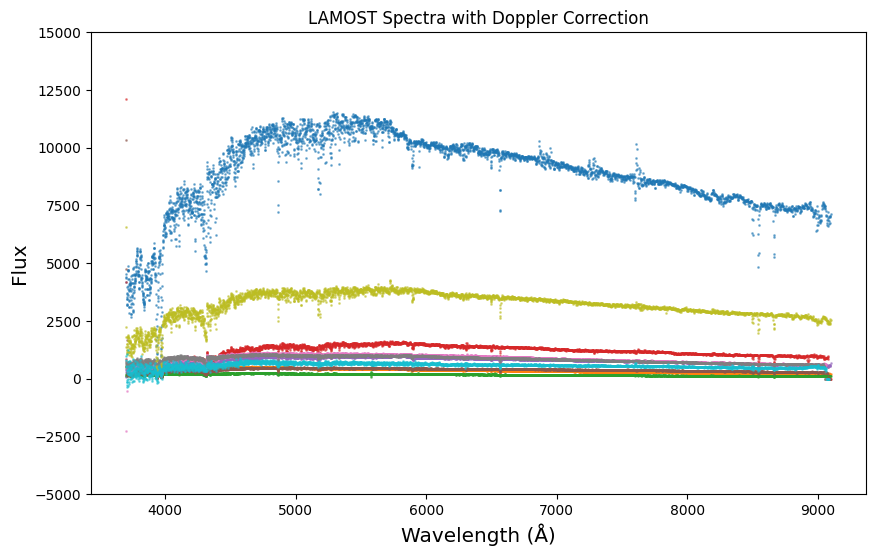

In [3]:
import astropy.io.fits as afits
import matplotlib.pyplot as plt
from scipy.interpolate import splrep, splev
import numpy as np

path = _find('lamost_spectra') + '/'
star_hdus = afits.open(_find('allstar.fits'))
star = star_hdus[1].data
star_hdus.close()
c = 3 * 10**5

fig = plt.figure(num=None, figsize=(10,6), facecolor='w', edgecolor='k') 

for i in range(10):
    filename = f"{path}spec-{star['combined_lmjd'][i]}-{star['combined_planid'][i]}_sp{str(star['combined_spid'][i]).zfill(2)}-{str(star['combined_fiberid'][i]).zfill(3)}.fits.gz"
    
    try:
        ss_hdus = afits.open(filename)
    except:
        continue
    
    # 从第二个HDU获取表格数据
    table_data = ss_hdus[1].data
    
    if table_data is None or len(table_data) == 0:
        ss_hdus.close()
        continue
    
    # 获取第一行的各个字段
    row = table_data[0]
    
    # 提取波长和通量
    wavelength = row['WAVELENGTH']
    flux = row['FLUX']
    
    # 多普勒校正
    rv = star['combined_rv'][i]
    dss = wavelength * rv / c
    wavelength_corrected = wavelength - dss
    
    # 插值和重新采样
    spl = splrep(wavelength_corrected, flux, k=3)
    flxc = splev(wavelength, spl, der=0)
    
    # 绘制
    plt.scatter(wavelength, flxc, s=1, alpha=0.5)
    
    ss_hdus.close()

plt.xlabel('Wavelength (Å)')
plt.ylabel('Flux')
plt.ylim(-5000,15000)
plt.title('LAMOST Spectra with Doppler Correction')
plt.show()

In [4]:
ss3890 = range(3800, 9000, 1)#创建一个从3800到8999埃(Å)的整数序列，步长为1埃。这定义了一个统一的波长网格，覆盖了大部分光学波段(380-900纳米)

def load_all(NUM, path, star, c, ss3890):
    datacube = []
    filenames = []

    for i in range(NUM):
        filename = f"{path}spec-{star['combined_lmjd'][i]}-{star['combined_planid'][i]}_sp{str(star['combined_spid'][i]).zfill(2)}-{str(star['combined_fiberid'][i]).zfill(3)}.fits.gz"
        # 读取信息
        try:
            ss_hdus = afits.open(filename)
        except Exception as e:
            print(f"打开文件{filename}时出错: {e}")
            continue

        table_data = ss_hdus[1].data
        if table_data is None or len(table_data) == 0:
            ss_hdus.close()
            continue

        # 获取第一行的各个字段
        row = table_data[0]

        # 提取波长和通量
        wavelength = row['WAVELENGTH']
        flux = row['FLUX']

        # 多普勒校正
        rv = star['combined_rv'][i]
        dss = wavelength * rv / c
        wavelength_corrected = wavelength - dss

        # 1. 过滤 NaN/inf 无效值（保证 x 和 y 一一对应）
        valid_mask = ~(np.isnan(wavelength_corrected) | np.isinf(wavelength_corrected) | 
               np.isnan(flux) | np.isinf(flux))
        wav_clean = wavelength_corrected[valid_mask]
        flux_clean = flux[valid_mask]

        # 2. 校验有效数据点数量（三次样条至少需要 4 个点）
        if len(wav_clean) < 4 or len(flux_clean) < 4:
            print(f"警告：当前光谱有效数据点不足（仅 {len(wav_clean)} 个），跳过{filename}")
            continue  # 跳过这条脏数据，处理下一条

# 3. 校验并排序，保证波长数据单调递增（splrep 核心要求）
        if not np.all(np.diff(wav_clean) >= 0):
            sort_indices = np.argsort(wav_clean)
            wav_clean = wav_clean[sort_indices]
            flux_clean = flux_clean[sort_indices]

        # 插值和重新采样
        spl = splrep(wavelength_corrected, flux, k=3)
        
        flxc = splev(ss3890, spl, der=0)
        filenames.append(filename) 
        datacube.append(flxc)
        
        ss_hdus.close()
    return ss3890, datacube,filenames
#批量加载，物理校正，标准化采样，数据组织

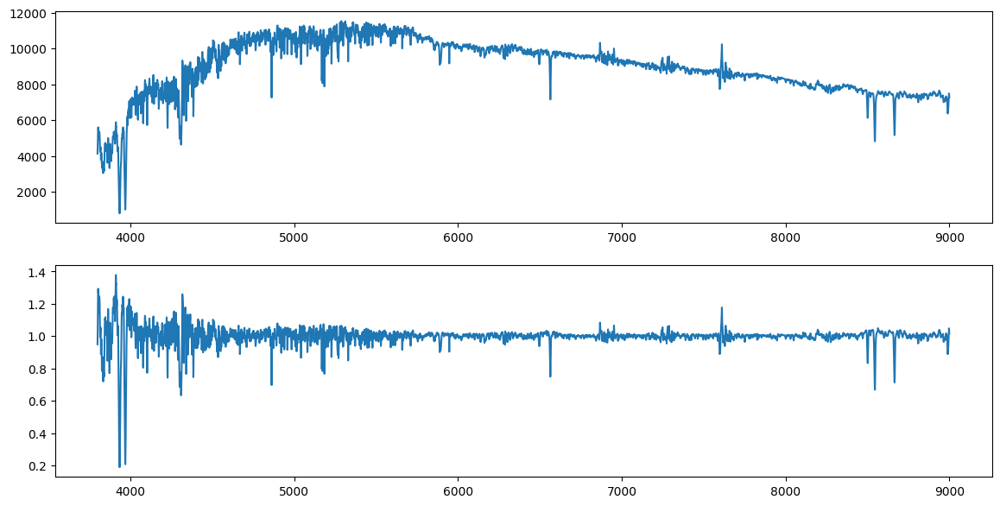

In [5]:
freqs, fluxes,filenames = load_all(10,path, star, c, ss3890)#调用函数加在数据

#定义函数，光谱平滑和连续谱归一化
def smooth_rescale_array(A, n_smooth=0, n_rescale=100, deg=3, gass_kernel=True):
    '''
    对光谱进行平滑和连续谱归一化
    Parameters:
    -----------
    A : array
        原始光谱流量数组
    n_smooth : int
        平滑窗口半宽，实际窗口大小为 2*n_smooth+1
        如果为0，则不进行平滑
    n_rescale : int
        连续谱估计窗口半宽，实际窗口大小为 2*n_rescale+1
    deg : int
        Savitzky-Golay滤波器的多项式阶数
    gass_kernel : bool
        是否使用高斯核进行加权平均
    
    Returns:
    --------
    normalized_spectrum : array
        归一化后的光谱，连续谱近似为1
    '''
    
    # 1. 光谱平滑
    if n_smooth > 0 and len(A) > (2 * n_smooth + 1):
        # 确保窗口大小合适
        window_length = 2 * n_smooth + 1
        if window_length <= len(A):
            # Savitzky-Golay滤波器进行光谱平滑
            B = signal.savgol_filter(A, window_length, deg)
        else:
            B = A.copy()
    else:
        B = A.copy()
    
    # 2. 连续谱估计
    Bmeans = np.zeros_like(B)
    
    if gass_kernel:
        # 创建归一化的高斯核
        x = np.linspace(-3, 3, 2*n_rescale+1)  # 使用-3到3覆盖更多标准差
        kernel = np.exp(-x**2 / 2)
        kernel = kernel / kernel.sum()  # 关键：归一化高斯核
    else:
        # 简单平均的核
        kernel = np.ones(2*n_rescale+1) / (2*n_rescale+1)
    
    # 使用卷积进行高效的连续谱估计
    # 注意：mode='same'保持输出长度相同，边界使用填充
    if len(B) > len(kernel):
        # 使用卷积计算加权平均
        Bmeans = np.convolve(B, kernel, mode='same')
        
        # 处理边界效应（卷积在边界处可能不准确）
        # 对前n_rescale个点和后n_rescale个点使用局部平均
        for i in range(n_rescale):
            # 左边界
            left = max(0, i - n_rescale)
            right = min(len(B), i + n_rescale + 1)
            if gass_kernel:
                # 调整核的大小以适应边界窗口
                kernel_left = kernel[-(right-left):] if len(kernel) > (right-left) else kernel
                kernel_left = kernel_left / kernel_left.sum()  # 重新归一化
                Bmeans[i] = np.sum(B[left:right] * kernel_left[:right-left])
            else:
                Bmeans[i] = np.mean(B[left:right])
            
            # 右边界
            j = len(B) - 1 - i
            left = max(0, j - n_rescale)
            right = min(len(B), j + n_rescale + 1)
            if gass_kernel:
                kernel_right = kernel[:right-left] if len(kernel) > (right-left) else kernel
                kernel_right = kernel_right / kernel_right.sum()  # 重新归一化
                Bmeans[j] = np.sum(B[left:right] * kernel_right[:right-left])
            else:
                Bmeans[j] = np.mean(B[left:right])
    else:
        # 如果光谱比核还短，直接使用全局平均
        Bmeans[:] = B.mean()
    
    # 3. 连续谱归一化
    # 避免除零错误，加上小量
    normalized = B / np.maximum(Bmeans, 1e-10)
    
    return normalized

flux = fluxes[0]

#可视化对比，原始光谱与归一化谱
fig, axs = plt.subplots(2,1, figsize=(14,7))
axs[0].plot(freqs, flux)
axs[1].plot(freqs, smooth_rescale_array(flux, 0, 100, 3, gass_kernel=True))
plt.show()

## 1. build a dataset 构建数据集
### load and normalize 加载并标准化

In [12]:
from sklearn import cluster, decomposition, covariance, mixture, neighbors

In [6]:
import numpy as np
import pandas as pd
from sklearn import decomposition
from sklearn.preprocessing import StandardScaler  # 新增：标准化

# 1. 定义波长范围
ss37550 = np.arange(3750, 5000, 1)

# 2. 加载并预处理数据
freqs, Xraw,filenames = load_all(count, path, star, c, ss37550)
freqs = np.array(freqs)

X = np.array([
    smooth_rescale_array(flux, 0, 100, 3, gass_kernel=True)
    for flux in Xraw
    if len(flux) == len(ss37550)
])


d:\Anaconda\Lib\site-packages\pandas\core\computation\expressions.py:22: UserWarning: Pandas requires version '2.10.2' or newer of 'numexpr' (version '2.8.7' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
d:\Anaconda\Lib\site-packages\pandas\core\arrays\masked.py:56: UserWarning: Pandas requires version '1.4.2' or newer of 'bottleneck' (version '1.3.7' currently installed).
  from pandas.core import (


警告：当前光谱有效数据点不足（仅 0 个），跳过./lamost_spectra/spec-55910-B91005_sp10-111.fits.gz
警告：当前光谱有效数据点不足（仅 0 个），跳过./lamost_spectra/spec-55907-B90706_sp05-161.fits.gz
警告：当前光谱有效数据点不足（仅 0 个），跳过./lamost_spectra/spec-55939-B5593903_sp12-221.fits.gz
警告：当前光谱有效数据点不足（仅 0 个），跳过./lamost_spectra/spec-55919-B5591906_sp06-078.fits.gz
警告：当前光谱有效数据点不足（仅 0 个），跳过./lamost_spectra/spec-58190-HD081308N293923V01_sp08-156.fits.gz
警告：当前光谱有效数据点不足（仅 0 个），跳过./lamost_spectra/spec-55938-B5593804_sp02-250.fits.gz
警告：当前光谱有效数据点不足（仅 0 个），跳过./lamost_spectra/spec-55938-B5593804_sp16-025.fits.gz
警告：当前光谱有效数据点不足（仅 0 个），跳过./lamost_spectra/spec-55938-B5593804_sp16-027.fits.gz
警告：当前光谱有效数据点不足（仅 0 个），跳过./lamost_spectra/spec-55938-B5593804_sp01-246.fits.gz
警告：当前光谱有效数据点不足（仅 0 个），跳过./lamost_spectra/spec-55940-B5594006_sp13-182.fits.gz
警告：当前光谱有效数据点不足（仅 0 个），跳过./lamost_spectra/spec-55997-B5599707_sp07-215.fits.gz
警告：当前光谱有效数据点不足（仅 0 个），跳过./lamost_spectra/spec-55938-B5593806_sp05-191.fits.gz
警告：当前光谱有效数据点不足（仅 0 个），跳过./lamost_spectra/spec-55920-B55920

In [7]:
freqs

array([3750, 3751, 3752, ..., 4997, 4998, 4999])

In [8]:
type(X)
X.shape

(17675, 1250)

## 2. Dimension Reduction + Clustering  维度缩减 + 聚类

### DR to 32 features 维度减少到32个特征

In [9]:
# 标准化数据
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 用标准化后的数据做 PCA
pca = decomposition.PCA(32)
Xproj = pca.fit_transform(X_scaled)
X_new = pca.inverse_transform(Xproj)

# 6. 输出结果
print("特征数量:", pca.n_features_in_)

n_components = pca.n_components_
explained_var_ratio = pca.explained_variance_ratio_
explained_var = pca.explained_variance_
cumulative_var = np.cumsum(explained_var_ratio)

pc_df = pd.DataFrame({
    '主成分': [f'PC{i+1}' for i in range(n_components)],
    '特征值(方差)': explained_var,
    '方差贡献率(%)': explained_var_ratio * 100,
    '累计贡献率(%)': cumulative_var * 100
})

print(f"原始特征维度: {pca.n_features_in_}")
print(f"主成分数量: {n_components}")
print(f"总解释方差: {cumulative_var[-1]:.4f} ({cumulative_var[-1]*100:.2f}%)")

print("\n详细主成分贡献表:")
pd.set_option('display.float_format', '{:.4f}'.format)
print(pc_df.to_string(index=False))

特征数量: 1250
原始特征维度: 1250
主成分数量: 32
总解释方差: 0.3816 (38.16%)

详细主成分贡献表:
 主成分  特征值(方差)  方差贡献率(%)  累计贡献率(%)
 PC1  94.8850    7.5904    7.5904
 PC2  74.5805    5.9661   13.5565
 PC3  61.1154    4.8890   18.4454
 PC4  30.5854    2.4467   20.8921
 PC5  21.1004    1.6879   22.5801
 PC6  14.9401    1.1951   23.7752
 PC7  11.8004    0.9440   24.7192
 PC8  10.6849    0.8547   25.5739
 PC9   9.7876    0.7830   26.3569
PC10   9.3342    0.7467   27.1036
PC11   8.7889    0.7031   27.8067
PC12   7.9847    0.6387   28.4454
PC13   7.8563    0.6285   29.0739
PC14   7.6417    0.6113   29.6852
PC15   7.4452    0.5956   30.2807
PC16   7.3049    0.5844   30.8651
PC17   7.2611    0.5809   31.4460
PC18   7.1469    0.5717   32.0177
PC19   6.8407    0.5472   32.5649
PC20   6.7117    0.5369   33.1018
PC21   6.5913    0.5273   33.6291
PC22   5.8145    0.4651   34.0942
PC23   5.7470    0.4597   34.5539
PC24   5.3872    0.4310   34.9849
PC25   5.3830    0.4306   35.4155
PC26   5.2692    0.4215   35.8370
PC27   5.2399 

In [10]:
# --- 输出每个主成分的线性组合系数 ---
print("\n=== 主成分线性组合系数（前10个原始特征的系数）===")
feature_names = [f'λ_{wl:.0f}' for wl in freqs]

components_df = pd.DataFrame(
    pca.components_.T,
    index=feature_names,
    columns=[f'PC{i+1}' for i in range(n_components)]
)

print(components_df.head(5))


=== 主成分线性组合系数（前10个原始特征的系数）===
          PC1    PC2    PC3     PC4     PC5    PC6     PC7    PC8     PC9  \
λ_3750 0.0112 0.1097 0.0371 -0.0000 -0.0003 0.0001 -0.0001 0.0001 -0.0000   
λ_3751 0.0111 0.1095 0.0381 -0.0000 -0.0003 0.0001 -0.0000 0.0001 -0.0000   
λ_3752 0.0109 0.1092 0.0389 -0.0000 -0.0003 0.0001 -0.0000 0.0000 -0.0000   
λ_3753 0.0109 0.1092 0.0392 -0.0000 -0.0003 0.0001 -0.0000 0.0000 -0.0000   
λ_3754 0.0111 0.1094 0.0382 -0.0000 -0.0003 0.0001 -0.0000 0.0000 -0.0000   

         PC10  ...    PC23   PC24   PC25    PC26    PC27    PC28    PC29  \
λ_3750 0.0001  ... -0.0003 0.0000 0.0001 -0.0002 -0.0003 -0.0001 -0.0002   
λ_3751 0.0002  ... -0.0003 0.0000 0.0001 -0.0003 -0.0003 -0.0000 -0.0002   
λ_3752 0.0002  ... -0.0003 0.0000 0.0001 -0.0003 -0.0003 -0.0000 -0.0002   
λ_3753 0.0002  ... -0.0004 0.0000 0.0001 -0.0003 -0.0003 -0.0000 -0.0002   
λ_3754 0.0001  ... -0.0003 0.0000 0.0001 -0.0003 -0.0003 -0.0000 -0.0002   

          PC30    PC31   PC32  
λ_3750 -0.0001 -0

In [15]:
ss37550

array([3750, 3751, 3752, ..., 4997, 4998, 4999])

./lamost_spectra/spec-56785-HD152134N242036V01_sp14-085.fits.gz


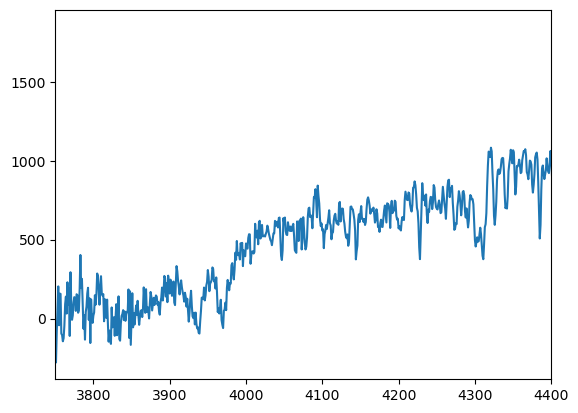

In [13]:
plt.plot(freqs, Xraw[9194])
plt.xlim(3750,4400)
print(filenames[9194])

./lamost_spectra/spec-57102-HD104509N022916V01_sp08-115.fits.gz


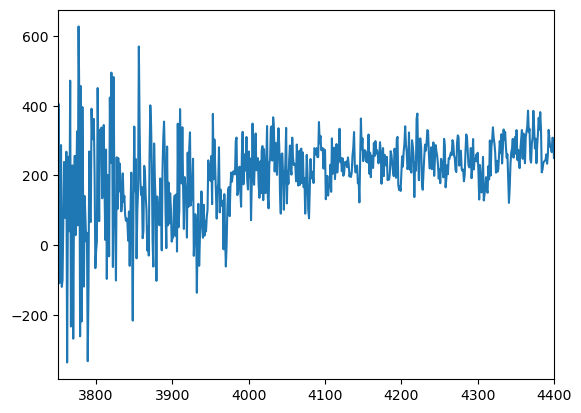

In [14]:
plt.plot(freqs, Xraw[9370])
plt.xlim(3750,4400)
print(filenames[9370])

### Dimension reduction

In [13]:
#创建K-means聚类，无监督机器学习，使得同簇数据点相似度最大化
n_clusters = 30
model = cluster.KMeans(n_clusters)
#执行，并获取光谱标签
y = model.fit_predict(X_new)

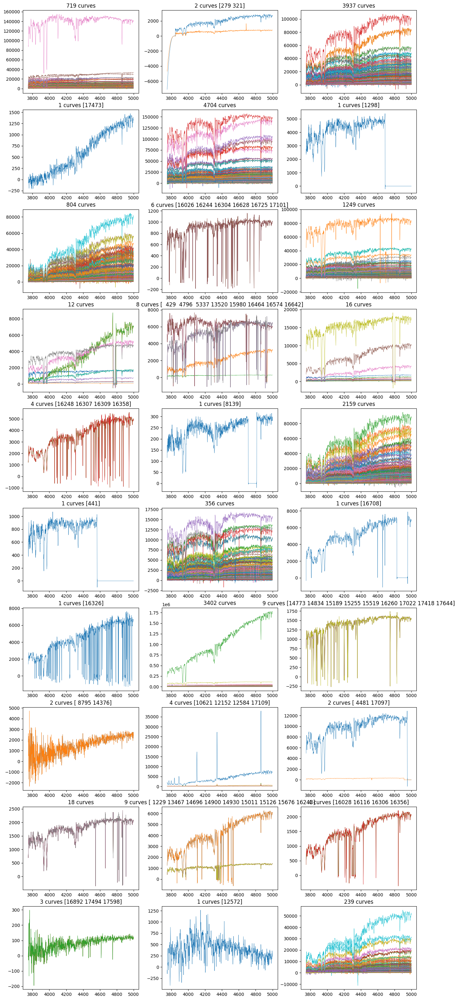

In [15]:
# 动态计算子图布局
ncols = 3
nrows = int(np.ceil(n_clusters / ncols))
fig, axs = plt.subplots(nrows, ncols, figsize=(16, 4*nrows))
axs = axs.flatten()  # 展平为一维数组

# 隐藏多余的子图
for i in range(n_clusters, len(axs)):
    axs[i].set_visible(False)

# 可视化每个簇
unique_labels = np.unique(y)  # 实际出现的标签（可能少于n_clusters）
for iy in unique_labels:
    ixs = np.where(y == iy)[0]
    for ix in ixs:
        axs[iy].plot(freqs, Xraw[ix], lw=0.5)
    title = f'{len(ixs)} curves'
    if len(ixs) < 10:
        title += f' {ixs}'  # 显示索引列表
    axs[iy].set_title(title)

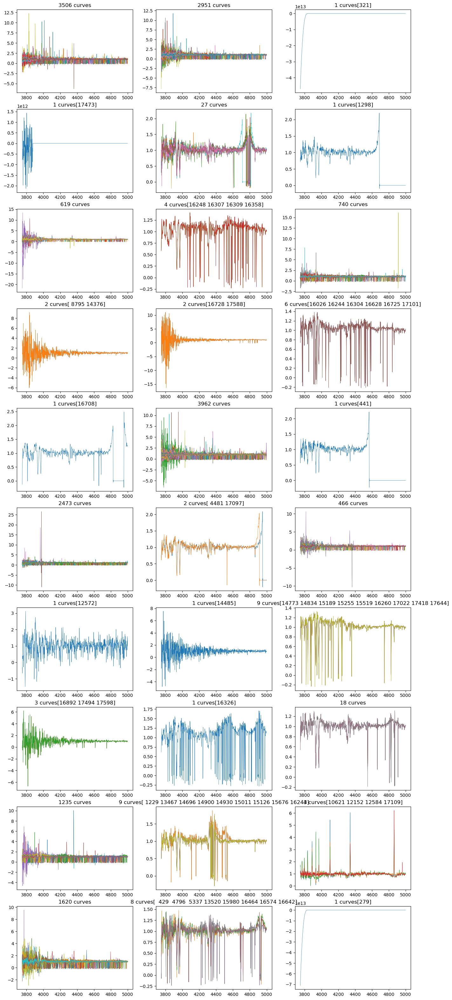

In [17]:
ncols = 3
nrows = int(np.ceil(n_clusters / ncols))
fig, axs = plt.subplots(nrows, ncols, figsize=(16, 4*nrows))
axs = axs.flatten()  # 展平为一维数组

# 隐藏多余的子图
for i in range(n_clusters, len(axs)):
    axs[i].set_visible(False)
    
for iy in set(list(y)):
    ixs = np.where(y == iy)
    for ix in ixs[0]:
        #axs[iy].plot(freqs[200:1200], X[ix][200:1200], lw=0.5)
        axs[iy].plot(freqs, X[ix], lw=0.5)
        figtitle = str(len(ixs[0]))+' curves'; 
        if len(ixs[0]) < 10: figtitle += str(ixs[0])
        axs[iy].set_title(figtitle)
        #axs[iy].set_ylim(1,2)

In [16]:
# 1. Continuum normalization
def normalize_continuum(flux, wave, deg=3):
    p = np.polyfit(wave, flux, deg)
    continuum = np.polyval(p, wave)
    return flux / continuum

# 2. CN/CH index
def compute_index(flux, wave, band, blue, red):
    """
    通用指数计算
    吸收越强，指数越小（小于阈值为异常）
    """
    F_band = np.mean(flux[(wave >= band[0]) & (wave <= band[1])])
    F_blue = np.mean(flux[(wave >= blue[0]) & (wave <= red[0])])
    F_red  = np.mean(flux[(wave >= red[0]) & (wave <= red[1])])
    F_cont = (F_blue + F_red)/2
    return -2.5 * np.log10(F_band / F_cont)

# 3. 波段定义
cn_bands = {
    "CN3839": {"band": (3839-15, 3839+15), "blue": (3810, 3830), "red": (3860, 3870)},
    "CN4142": {"band": (4142-40, 4142+40), "blue": (4120, 4135), "red": (4160, 4175)},  # 波段加大到 ~80
    "CH4309": {"band": (4309-20, 4309+20), "blue": (4270, 4290), "red": (4330, 4350)}  # CH 指数
}

# 4. 阈值设定
th_CN3839 = 0.01  # CN3839 阈值
th_CN4142 = 0.01  # CN4142 阈值
th_CH4309 = -0.01  # CH4309 阈值，用来判断是否出现吸收

# 5. Process each cluster
cluster_labels = np.unique(y)
results = []

for cl in cluster_labels:
    idxs = np.where(y == cl)[0]
    if len(idxs) < 10:
        continue  # 簇内光谱数 ≥ 10

    # 簇内光谱归一化
    cluster_flux = np.array([normalize_continuum(X[i], freqs) for i in idxs])

    # 计算每条光谱 CN/CH 指数
    CN3839_list = np.array([compute_index(f, freqs, **cn_bands["CN3839"]) for f in cluster_flux])
    CN4142_list = np.array([compute_index(f, freqs, **cn_bands["CN4142"]) for f in cluster_flux])
    CH4309_list = np.array([compute_index(f, freqs, **cn_bands["CH4309"]) for f in cluster_flux])

    # 异常 CN + CH 不吸收
    # CN3839 和 CN4142 小于阈值 → 有 CN 吸收
    # CH4309 大于阈值 → 没有 CH 吸收（排除 C 丰富）
    abnormal_idx = idxs[
        (CN3839_list < th_CN3839) &
        (CN4142_list < th_CN4142) &
        (CH4309_list > th_CH4309)
    ]

    # 保存结果
    results.append({
        "cluster": cl,
        "idxs": idxs,
        "CN3839": CN3839_list,
        "CN4142": CN4142_list,
        "CH4309": CH4309_list,
        "abnormal_idx": abnormal_idx
    })

In [ ]:
# 遍历所有字典，逐个查看
for idx, item in enumerate(results):
    print(f"===== 第 {idx+1} 个字典 =====")
    print("CN3839:", len(item["CN3839"]))
    print("CN4142:", len(item["CN4142"]))
    print("CH4309:", len(item["CH4309"]))

===== 第 1 个字典 =====
CN3839: 3506
CN4142: 3506
CH4309: 3506

===== 第 2 个字典 =====
CN3839: 2951
CN4142: 2951
CH4309: 2951

===== 第 3 个字典 =====
CN3839: 27
CN4142: 27
CH4309: 27

===== 第 4 个字典 =====
CN3839: 619
CN4142: 619
CH4309: 619

===== 第 5 个字典 =====
CN3839: 740
CN4142: 740
CH4309: 740

===== 第 6 个字典 =====
CN3839: 3962
CN4142: 3962
CH4309: 3962

===== 第 7 个字典 =====
CN3839: 2473
CN4142: 2473
CH4309: 2473

===== 第 8 个字典 =====
CN3839: 466
CN4142: 466
CH4309: 466

===== 第 9 个字典 =====
CN3839: 18
CN4142: 18
CH4309: 18

===== 第 10 个字典 =====
CN3839: 1235
CN4142: 1235
CH4309: 1235

===== 第 11 个字典 =====
CN3839: 1620
CN4142: 1620
CH4309: 1620



In [28]:
sum_cn3839 = sum(len(d["CN3839"]) for d in results)
sum_cn4142 = sum(len(d["CN4142"]) for d in results)
sum_ch4309 = sum(len(d["CH4309"]) for d in results)

print(sum_cn3839, sum_cn4142, sum_ch4309)

17617 17617 17617


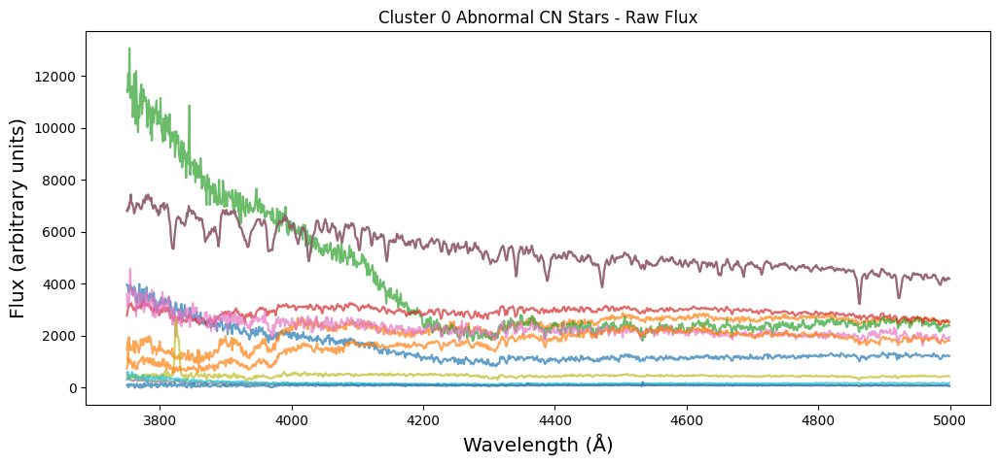

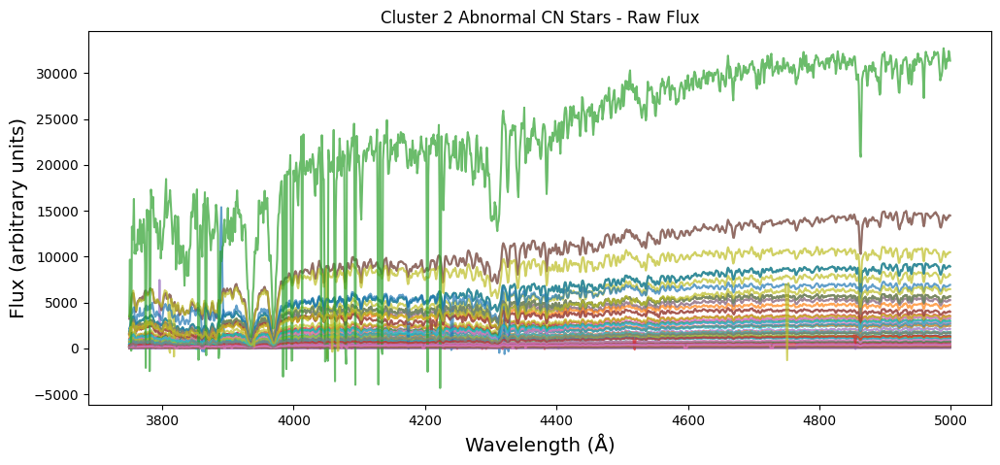

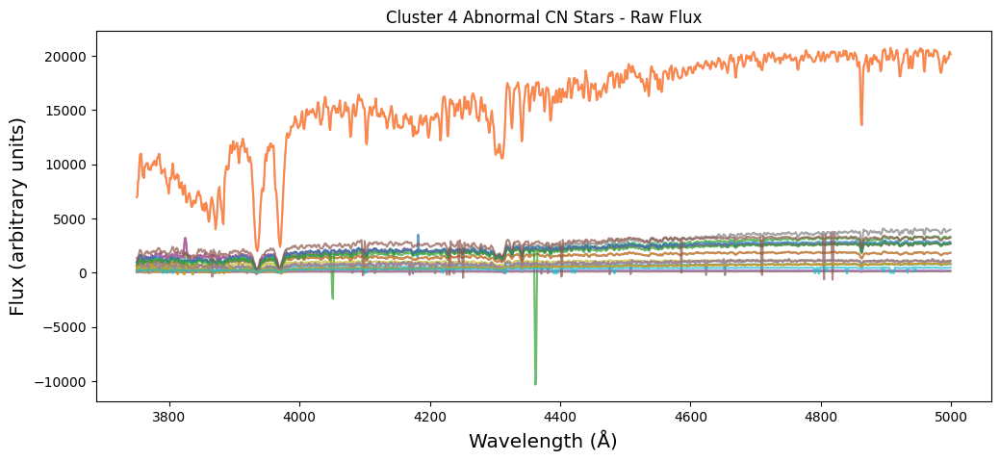

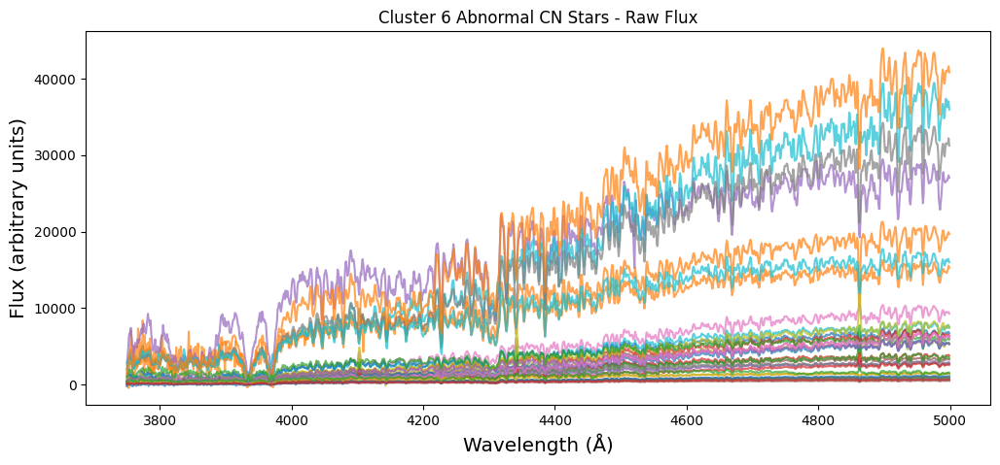

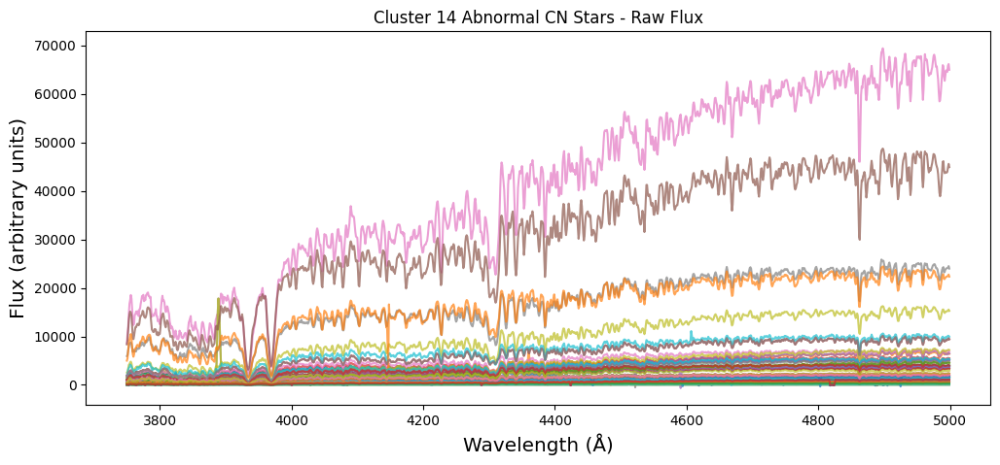

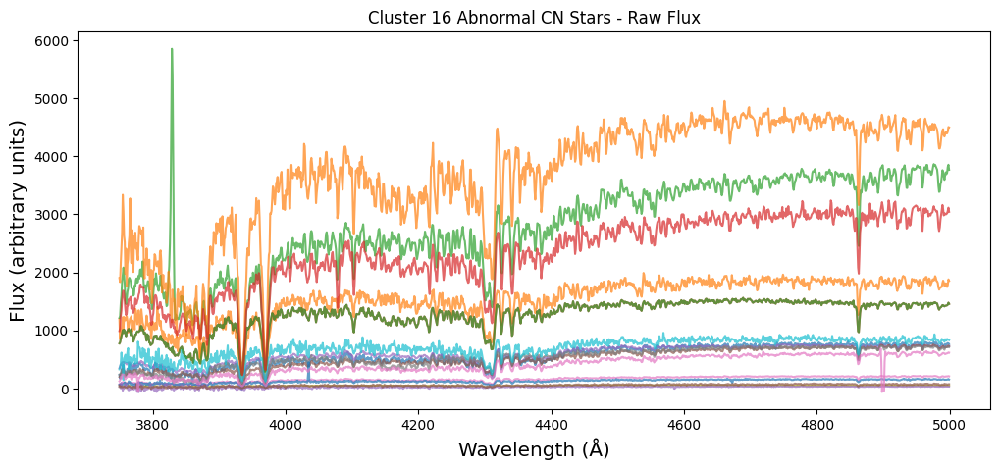

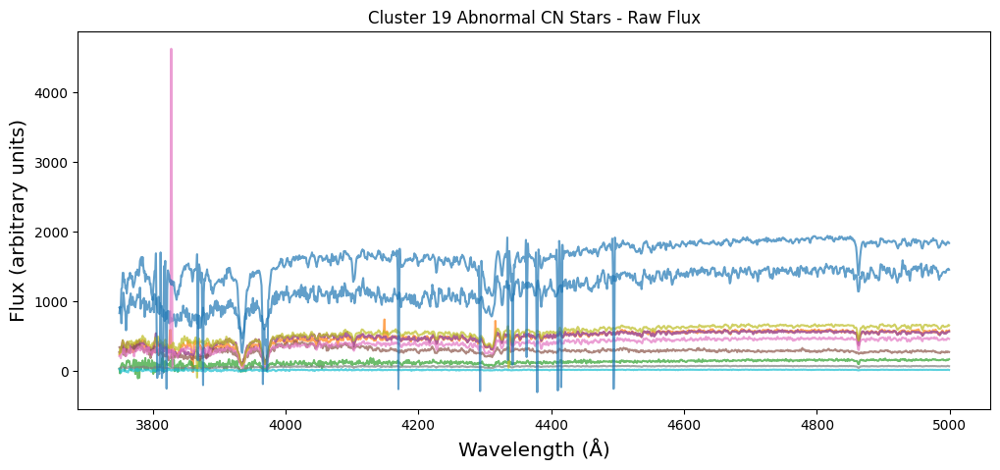

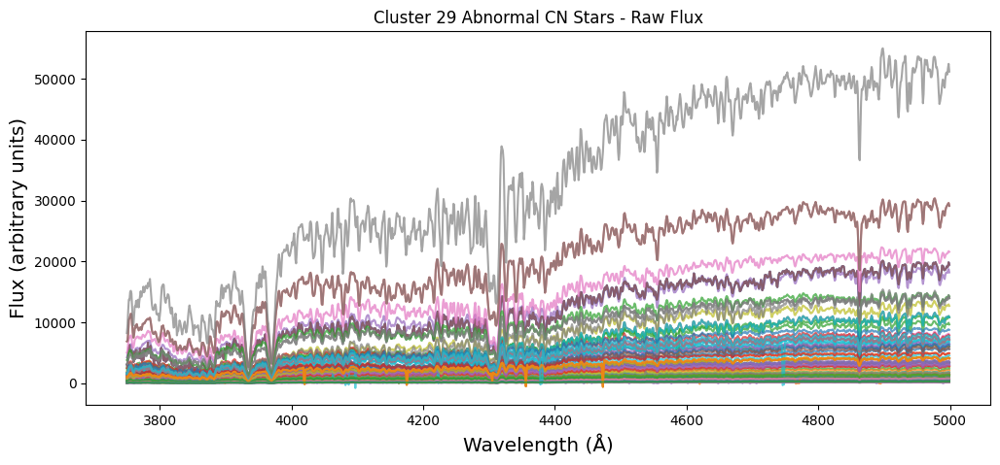

In [17]:
# 绘制异常光谱的原始光谱
for cluster_info in results:
    cl = cluster_info["cluster"]
    abnormal_idx = cluster_info["abnormal_idx"]
    if len(abnormal_idx) == 0:
        continue  # 如果没有异常光谱跳过

    plt.figure(figsize=(12,5))
    for i in abnormal_idx:
        # 原始光谱 X[i] 是未归一化光谱
        plt.plot(freqs, Xraw[i], alpha=0.7, label=f'obs {i}')
    
    plt.title(f"Cluster {cl} Abnormal CN Stars - Raw Flux")
    plt.xlabel("Wavelength (Å)")
    plt.ylabel("Flux (arbitrary units)")
    plt.show()

In [ ]:
import os
import glob
import numpy as np
import pandas as pd
import astropy.io.fits as afits
from astropy.coordinates import SkyCoord
import astropy.units as u

# =========================
# 输出目录
# =========================
outdir = _os.path.join("Data", "cn_screen_result")
os.makedirs(outdir, exist_ok=True)

# =========================
# 读取参考表 CSV
# =========================
ref_file = _find('table3readablecorr.csv')
ref_df = pd.read_csv(ref_file)

if "RA" not in ref_df.columns or "DEC" not in ref_df.columns:
    raise ValueError("参考表缺少 RA 或 DEC 列")

ref_df = ref_df.dropna(subset=["RA", "DEC"]).copy()
ref_df["RA"] = pd.to_numeric(ref_df["RA"], errors="coerce")
ref_df["DEC"] = pd.to_numeric(ref_df["DEC"], errors="coerce")
ref_df = ref_df.dropna(subset=["RA", "DEC"]).reset_index(drop=True)

print(f"成功读取参考表: {ref_file}, 行数 = {len(ref_df)}")

# =========================
# 匹配半径
# =========================
match_radius = 2.0 * u.arcsec

# =========================
# Step 1: 遍历“所有数据集”并与参考表比对
# 这里默认用 filenames，表示真正进入你程序的数据
# 如果你想扫整个文件夹，把下面这一行改成：
# all_spec_files = sorted(glob.glob("./lamost_spectra/*.fits.gz"))
# =========================
all_spec_files = filenames

dataset_records = []

for i, spec_file in enumerate(all_spec_files):

    try:
        with afits.open(spec_file) as hdus:
            hdr = hdus[0].header

        dataset_records.append({
            "Filename": spec_file,
            "RA": hdr.get("RA", np.nan),
            "DEC": hdr.get("DEC", np.nan),
            "Teff": hdr.get("TEFF", np.nan),
            "logg": hdr.get("LOGG", np.nan),
            "[Fe/H]": hdr.get("FEH", np.nan),
            "RV": hdr.get("RV", np.nan),
            "LMJD": hdr.get("LMJD", np.nan),
            "PlanID": hdr.get("PLANID", np.nan),
            "SPID": hdr.get("SPID", np.nan),
            "FiberID": hdr.get("FIBERID", np.nan)
        })

    except Exception as e:
        print(f"警告: 读取数据集文件失败: {spec_file}, 原因: {e}")

dataset_df = pd.DataFrame(dataset_records).drop_duplicates().reset_index(drop=True)
dataset_df = dataset_df.dropna(subset=["RA", "DEC"]).copy()

dataset_df["RA"] = pd.to_numeric(dataset_df["RA"], errors="coerce")
dataset_df["DEC"] = pd.to_numeric(dataset_df["DEC"], errors="coerce")
dataset_df = dataset_df.dropna(subset=["RA", "DEC"]).reset_index(drop=True)

# 参考表 -> 数据集
ref_sky = SkyCoord(ra=ref_df["RA"].values * u.deg,
                   dec=ref_df["DEC"].values * u.deg)

dataset_sky = SkyCoord(ra=dataset_df["RA"].values * u.deg,
                       dec=dataset_df["DEC"].values * u.deg)

idx_match_dataset, sep2d_dataset, _ = ref_sky.match_to_catalog_sky(dataset_sky)
is_match_dataset = sep2d_dataset < match_radius

ref_in_dataset_df = ref_df.copy()
ref_in_dataset_df["matched_in_dataset"] = is_match_dataset
ref_in_dataset_df["dataset_sep_arcsec"] = sep2d_dataset.arcsec
ref_in_dataset_df["dataset_file"] = None
ref_in_dataset_df.loc[is_match_dataset, "dataset_file"] = dataset_df.iloc[idx_match_dataset[is_match_dataset]]["Filename"].values

n_ref = len(ref_df)
n_dataset = len(dataset_df)

# =========================
# Step 2: 遍历筛选结果并与参考表比对
# =========================
abnormal_records = []

for cluster_info in results:
    cl = cluster_info["cluster"]
    abnormal_idx = cluster_info["abnormal_idx"]
    idxs = cluster_info["idxs"]
    CN3839_list = cluster_info["CN3839"]
    CN4142_list = cluster_info["CN4142"]
    CH4309_list = cluster_info["CH4309"]

    idxs_list = idxs.tolist()

    for idx in abnormal_idx:
        spec_file = filenames[idx]

        try:
            with afits.open(spec_file) as hdus:
                hdr = hdus[0].header
        except Exception as e:
            print(f"警告: 读取筛选结果文件失败: {spec_file}, 原因: {e}")
            continue

        local_pos = idxs_list.index(idx)

        abnormal_records.append({
            "cluster": cl,
            "CN3839": CN3839_list[local_pos],
            "CN4142": CN4142_list[local_pos],
            "CH4309": CH4309_list[local_pos],
            "Filename": spec_file,
            "RA": hdr.get("RA", np.nan),
            "DEC": hdr.get("DEC", np.nan),
            "Teff": hdr.get("TEFF", np.nan),
            "logg": hdr.get("LOGG", np.nan),
            "[Fe/H]": hdr.get("FEH", np.nan),
            "RV": hdr.get("RV", np.nan),
            "LMJD": hdr.get("LMJD", np.nan),
            "PlanID": hdr.get("PLANID", np.nan),
            "SPID": hdr.get("SPID", np.nan),
            "FiberID": hdr.get("FIBERID", np.nan)
        })

abnormal_df = pd.DataFrame(abnormal_records).drop_duplicates().reset_index(drop=True)

if len(abnormal_df) == 0:
    print("\n没有筛选到任何异常候选。")
    abnormal_true_df = pd.DataFrame()
else:
    abnormal_df = abnormal_df.dropna(subset=["RA", "DEC"]).copy()
    abnormal_df["RA"] = pd.to_numeric(abnormal_df["RA"], errors="coerce")
    abnormal_df["DEC"] = pd.to_numeric(abnormal_df["DEC"], errors="coerce")
    abnormal_df = abnormal_df.dropna(subset=["RA", "DEC"]).reset_index(drop=True)

    abnormal_sky = SkyCoord(ra=abnormal_df["RA"].values * u.deg,
                            dec=abnormal_df["DEC"].values * u.deg)

    # 筛选结果 -> 参考表
    idx_match_abn, sep2d_abn, _ = abnormal_sky.match_to_catalog_sky(ref_sky)
    is_match_abn = sep2d_abn < match_radius

    abnormal_df["matched_ref"] = is_match_abn
    abnormal_df["ref_sep_arcsec"] = sep2d_abn.arcsec

    # 给筛选正确结果补充参考表中的对应行号
    abnormal_df["ref_index"] = -1
    abnormal_df.loc[is_match_abn, "ref_index"] = idx_match_abn[is_match_abn]

    abnormal_true_df = abnormal_df[abnormal_df["matched_ref"] == True].copy().reset_index(drop=True)

    if len(abnormal_true_df) > 0:
        matched_ref_rows = ref_df.iloc[abnormal_true_df["ref_index"].values].reset_index(drop=True)
        matched_ref_rows = matched_ref_rows.add_prefix("ref_")
        abnormal_true_df = pd.concat([abnormal_true_df, matched_ref_rows], axis=1)

# =========================
# Step 3: 统计打印
# =========================
n_abnormal = len(abnormal_df) if 'abnormal_df' in locals() else 0
n_true_abnormal = len(abnormal_true_df) if 'abnormal_true_df' in locals() else 0

print(f"参考表恒星总数: {n_ref}")
print(f"数据集中成功读取并可匹配坐标的恒星数: {n_dataset}")
print(f"参考表中在数据集里找到的恒星数: {n_ref_found_in_dataset}")

print(f"筛选候选总数: {n_abnormal}")
print(f"筛选结果中正确命中数: {n_true_abnormal}")
print(f"匹配半径: {match_radius}")

# =========================
# Step 4: 只保存“筛选正确的结果”
# =========================
correct_outfile = os.path.join(outdir, "abnormal_star_candidates_correct.csv")
abnormal_true_df.to_csv(correct_outfile, index=False, encoding="utf-8-sig")

print(f"\n已保存筛选正确的结果: {correct_outfile}")

成功读取参考表: table3readablecorr.csv, 行数 = 106

================ 数据集覆盖验证 =================
参考表恒星总数: 106
数据集中成功读取并可匹配坐标的恒星数: 14621
参考表中在数据集里找到的恒星数: 83
数据集对参考表覆盖率: 0.7830
匹配半径: 2.0 arcsec

================ 筛选结果验证 =================
筛选候选总数: 295
筛选结果中正确命中数: 47
筛选结果命中率(precision-like): 0.1593
相对参考表总召回率(recall-like): 0.4434
相对“数据集中已包含的参考星”的命中率: 0.5663
匹配半径: 2.0 arcsec

已保存筛选正确的结果: cn_screen_result\abnormal_star_candidates_correct.csv


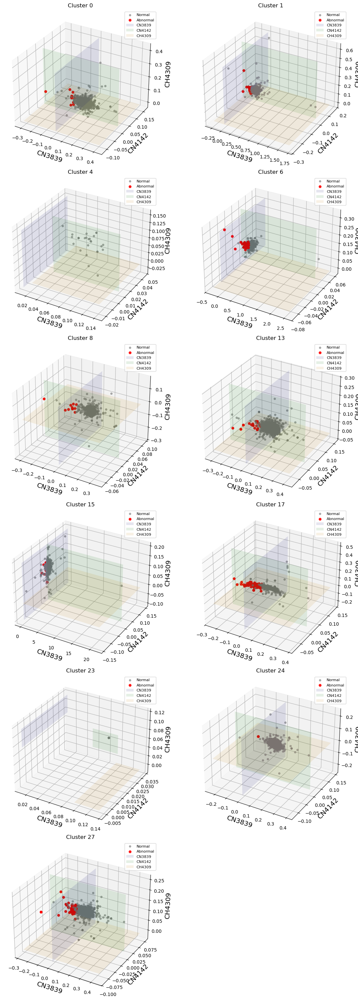

In [72]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

def plot_cluster_CN3D(results, th_CN3839=None, th_CN4142=None, th_CH4309=None):
    """
    绘制每个簇的三维 CN 指数散点图：
    x=CN3839, y=CN4142, z=CH4309
    异常光谱标红
    阈值用虚线平面标注
    """
    n_clusters = len(results)
    ncols = 2
    nrows = int(np.ceil(n_clusters / ncols))

    fig = plt.figure(figsize=(6*ncols, 5*nrows))

    for i, cl_res in enumerate(results):
        ax = fig.add_subplot(nrows, ncols, i+1, projection='3d')

        idxs = cl_res["idxs"]
        CN3839 = cl_res["CN3839"]
        CN4142 = cl_res["CN4142"]
        ch4309 = cl_res.get("CH4309", None)
        abnormal_idx = cl_res["abnormal_idx"]

        abnormal_mask = np.isin(idxs, abnormal_idx)
        normal_mask = ~abnormal_mask

        # 绘制正常光谱
        ax.scatter(CN3839[normal_mask], CN4142[normal_mask], ch4309[normal_mask],
                   color='gray', s=15, alpha=0.6, label='Normal')
        # 绘制异常光谱
        ax.scatter(CN3839[abnormal_mask], CN4142[abnormal_mask], ch4309[abnormal_mask],
                   color='red', s=25, alpha=0.9, label='Abnormal')

        x = np.linspace(np.min(CN3839)-0.02, np.max(CN3839)+0.02, 10)
        y = np.linspace(np.min(CN4142)-0.02, np.max(CN4142)+0.02, 10)
        z = np.linspace(np.min(ch4309)-0.02, np.max(ch4309)+0.02, 10)
        xx, yy = np.meshgrid(x, y)
        xx2, zz2 = np.meshgrid(x, z)
        yy3, zz3 = np.meshgrid(y, z)

        # 1. CN3839 阈值平面（垂直于 X 轴）
        if th_CN3839 is not None:
            ax.plot_surface(th_CN3839 * np.ones_like(yy3), yy3, zz3,
                            color='blue', alpha=0.1, label='CN3839')

        # 2. CN4142 阈值平面（垂直于 Y 轴）
        if th_CN4142 is not None:
            ax.plot_surface(xx2, th_CN4142 * np.ones_like(xx2), zz2,
                            color='green', alpha=0.1, label='CN4142')

        # 3. CH4309 阈值平面（垂直于 Z 轴，水平平面）
        if th_CH4309 is not None:
            ax.plot_surface(xx, yy, th_CH4309 * np.ones_like(xx),
                            color='orange', alpha=0.1, label='CH4309')
        # ====================================================================

        ax.set_xlabel("CN3839")
        ax.set_ylabel("CN4142")
        ax.set_zlabel("CH4309")
        ax.set_title(f"Cluster {cl_res['cluster']}")
        ax.legend(fontsize=8)

    plt.tight_layout()
    plt.show()

# 调用（阈值可以自己改）
plot_cluster_CN3D(results,
                   th_CN3839=0.01,
                   th_CN4142=0.01,
                   th_CH4309=-0.01)

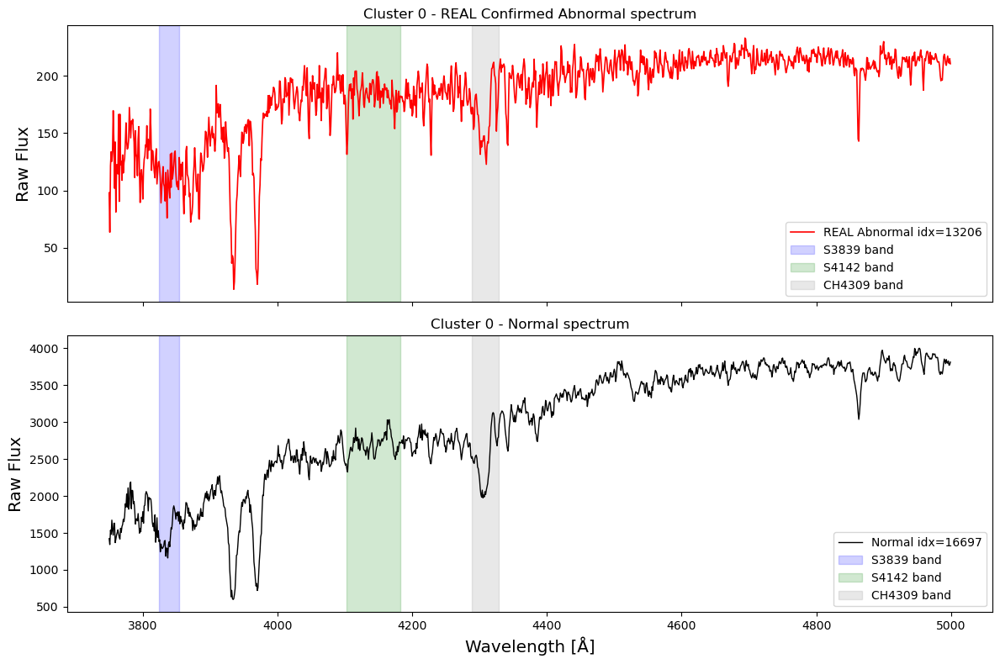

In [71]:
import random
import matplotlib.pyplot as plt
import numpy as np

def plot_raw_spectrum_comparison(cluster_result, Xraw, freqs, cn_bands, abnormal_df, seed=None):
    """
    绘制单簇示例光谱（原始光谱）：
    - 上图：随机选一条【真正匹配确认的异常光谱】
    - 下图：随机选一条正常光谱
    - 标注 S3839、S4142、CH4309 波段

    参数
    ----
    cluster_result : dict
        results 里的某一个簇结果
    Xraw : array-like
        原始光谱数组，Xraw[i] 对应第 i 条原始 flux
    freqs : array-like
        波长数组
    cn_bands : dict
        CN 波段定义
    abnormal_df : DataFrame
        已经天球匹配确认的真正异常恒星表（必须传入！）
    seed : int or None
        随机种子
    """
    if seed is not None:
        random.seed(seed)

    cl = cluster_result["cluster"]
    idxs = cluster_result["idxs"]
    abnormal_idx = cluster_result["abnormal_idx"]

    # ===================== 核心修改 =====================
    # 1. 从【真正确认的异常表】中提取当前簇的真实异常 idx
    real_abnormal_in_cluster = abnormal_df[abnormal_df["cluster"] == cl]
    real_abnormal_filenames = set(real_abnormal_in_cluster["Filename"].values)

    # 2. 只保留：在异常索引里 + 文件名在真实异常列表中的 idx
    real_abnormal_idx = []
    for idx in abnormal_idx:
        fname = filenames[idx]  # 全局的 filenames 数组
        if fname in real_abnormal_filenames:
            real_abnormal_idx.append(idx)
    # ====================================================

    normal_idx = [i for i in idxs if i not in abnormal_idx]

    # 判断是否有真正异常
    if len(real_abnormal_idx) == 0:
        print(f"簇 {cl} 内【没有经过天球匹配确认的真正异常光谱】")
        return
    if len(normal_idx) == 0:
        print(f"簇 {cl} 内没有正常光谱")
        return

    # 随机选择：只从【真正异常】里选
    ab_i = random.choice(real_abnormal_idx)
    norm_i = random.choice(normal_idx)

    flux_ab = Xraw[ab_i]
    flux_norm = Xraw[norm_i]

    fig, axes = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

    # 上图：真正异常光谱
    axes[0].plot(freqs, flux_ab, color='red', lw=1.2, label=f"REAL Abnormal idx={ab_i}")
    axes[0].axvspan(cn_bands["S3839"]["band"][0], cn_bands["S3839"]["band"][1],
                    color='blue', alpha=0.18, label='S3839 band')
    axes[0].axvspan(cn_bands["S4142"]["band"][0], cn_bands["S4142"]["band"][1],
                    color='green', alpha=0.18, label='S4142 band')
    axes[0].axvspan(cn_bands["CH4309"]["band"][0], cn_bands["CH4309"]["band"][1],
                    color='grey', alpha=0.18, label='CH4309 band')
    axes[0].set_ylabel("Raw Flux")
    axes[0].set_title(f"Cluster {cl} - REAL Confirmed Abnormal spectrum")
    axes[0].legend()

    # 下图：正常光谱
    axes[1].plot(freqs, flux_norm, color='black', lw=1.0, label=f"Normal idx={norm_i}")
    axes[1].axvspan(cn_bands["S3839"]["band"][0], cn_bands["S3839"]["band"][1],
                    color='blue', alpha=0.18, label='S3839 band')
    axes[1].axvspan(cn_bands["S4142"]["band"][0], cn_bands["S4142"]["band"][1],
                    color='green', alpha=0.18, label='S4142 band')
    axes[1].axvspan(cn_bands["CH4309"]["band"][0], cn_bands["CH4309"]["band"][1],
                    color='grey', alpha=0.18, label='CH4309 band')
    axes[1].set_xlabel("Wavelength [Å]")
    axes[1].set_ylabel("Raw Flux")
    axes[1].set_title(f"Cluster {cl} - Normal spectrum")
    axes[1].legend()

    plt.tight_layout()
    plt.show()

plot_raw_spectrum_comparison(results[0], Xraw, freqs, cn_bands, abnormal_df, seed=30)

成功读取参考表: table3readablecorr.csv, 行数 = 106
文件夹中找到 FITS 文件数: 18341
正在读取第 0/18341 个文件...
正在读取第 500/18341 个文件...
正在读取第 1000/18341 个文件...
正在读取第 1500/18341 个文件...
正在读取第 2000/18341 个文件...
正在读取第 2500/18341 个文件...
正在读取第 3000/18341 个文件...
正在读取第 3500/18341 个文件...
正在读取第 4000/18341 个文件...
正在读取第 4500/18341 个文件...
正在读取第 5000/18341 个文件...
正在读取第 5500/18341 个文件...
正在读取第 6000/18341 个文件...
正在读取第 6500/18341 个文件...
正在读取第 7000/18341 个文件...
正在读取第 7500/18341 个文件...
正在读取第 8000/18341 个文件...
正在读取第 8500/18341 个文件...
正在读取第 9000/18341 个文件...
正在读取第 9500/18341 个文件...
正在读取第 10000/18341 个文件...
正在读取第 10500/18341 个文件...
正在读取第 11000/18341 个文件...
正在读取第 11500/18341 个文件...
正在读取第 12000/18341 个文件...
正在读取第 12500/18341 个文件...
正在读取第 13000/18341 个文件...
正在读取第 13500/18341 个文件...
正在读取第 14000/18341 个文件...
正在读取第 14500/18341 个文件...
正在读取第 15000/18341 个文件...
正在读取第 15500/18341 个文件...
正在读取第 16000/18341 个文件...
正在读取第 16500/18341 个文件...
正在读取第 17000/18341 个文件...
正在读取第 17500/18341 个文件...
正在读取第 18000/18341 个文件...
成功读取到带 RA/DEC 的光谱文件数: 18341

=====

## 3. Dimension Reduction + Find NB + Compare 降维 + 寻找 NB + 比较

### For each sample, find 10 nbs 找最近的十个点

In [ ]:
#neighbors模块：多种基于邻近点的机器学习算法，特别适用于寻找数据点之间的相似性，在天体光谱分析中常用于识别相似光谱或检测异常值
from sklearn import neighbors

#NearestNeighbors是一种无监督学习算法，用于高效计算数据点间距离
model = neighbors.NearestNeighbors(n_neighbors=10)

#模型拟合训练
model.fit(Xproj)

#执行k近邻查询，为每个光谱找到10个最近邻
distances, nbids = model.kneighbors(Xproj, 10, )

### concentrate on 4040 - 4260

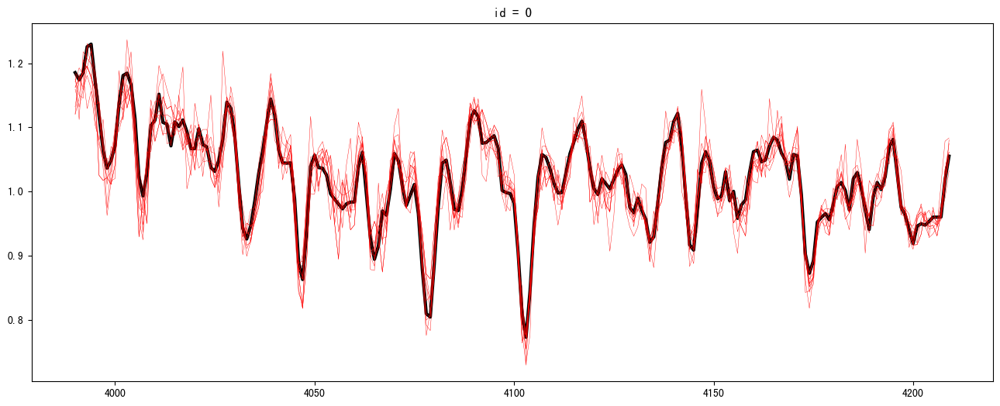

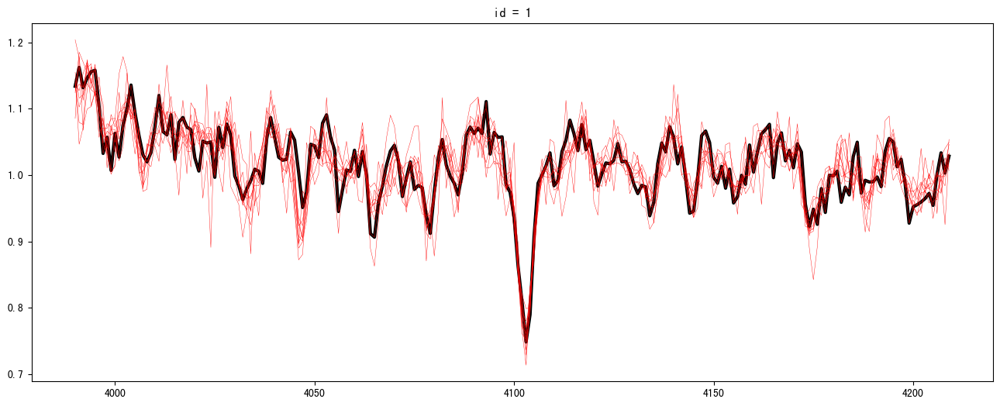

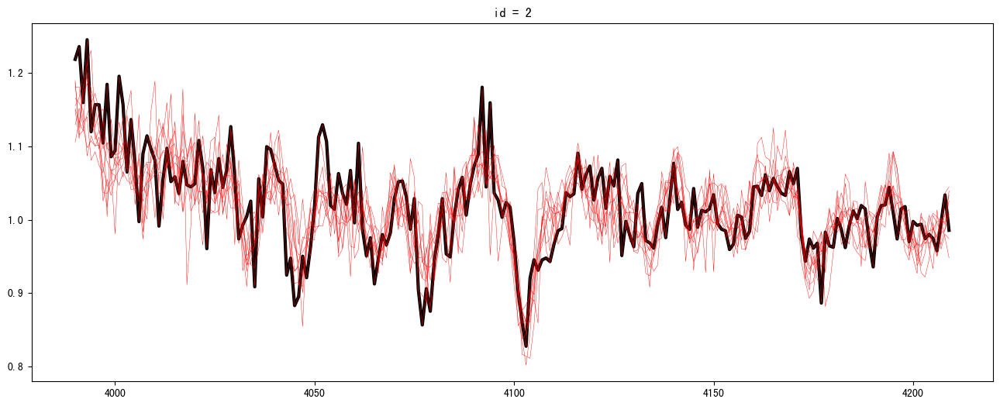

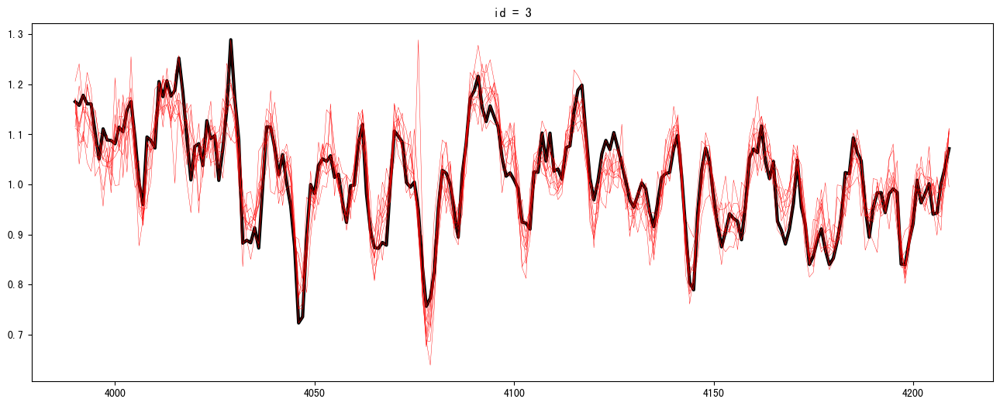

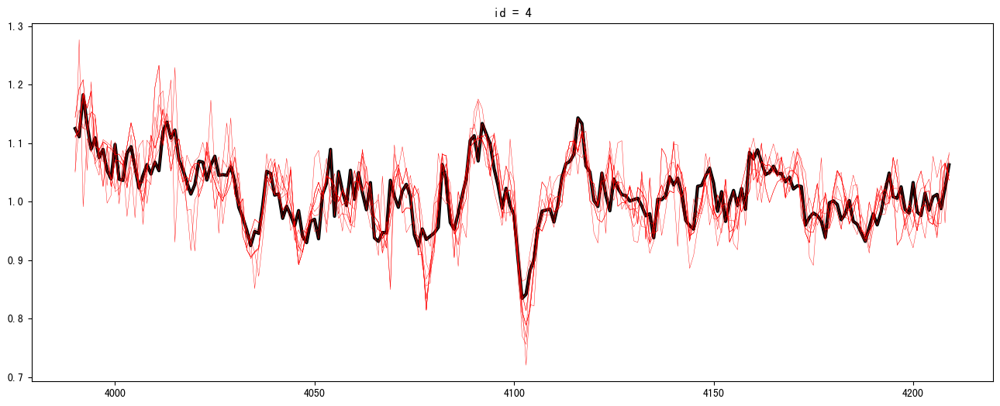

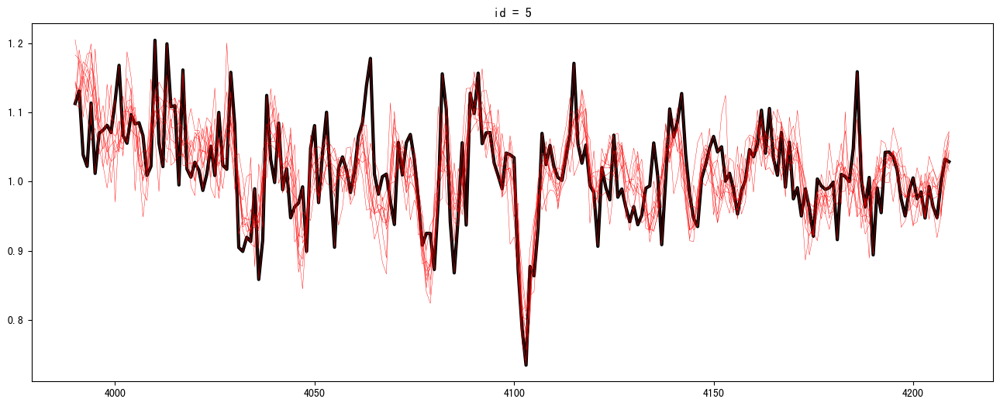

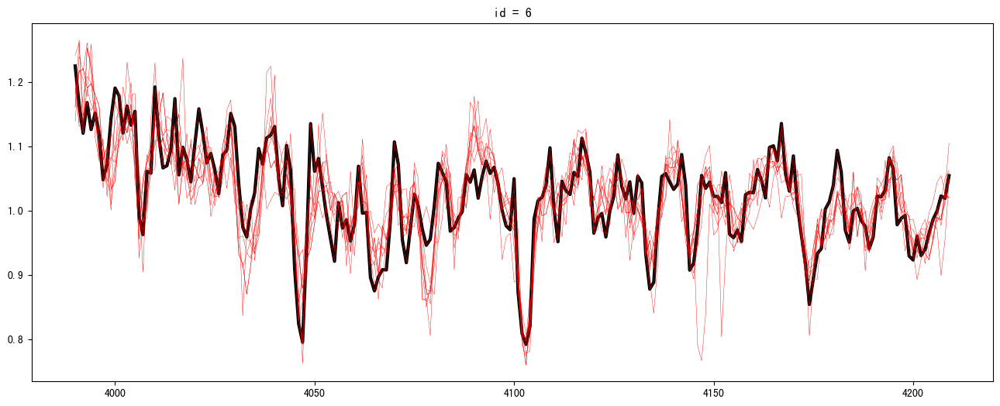

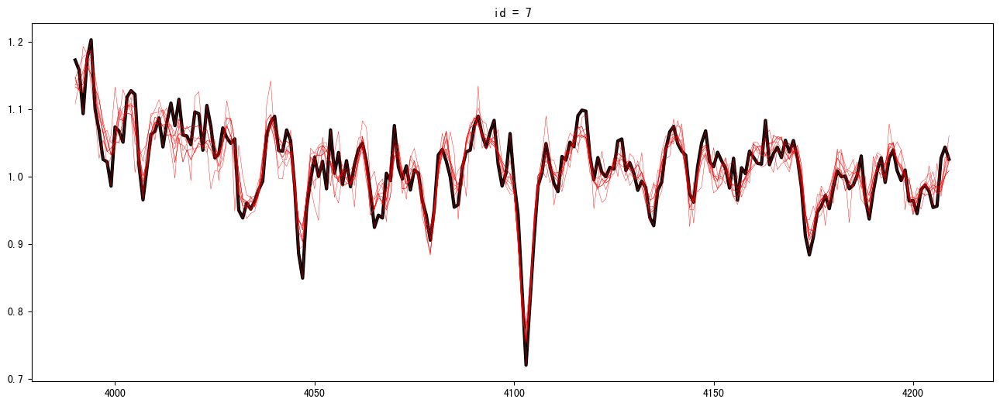

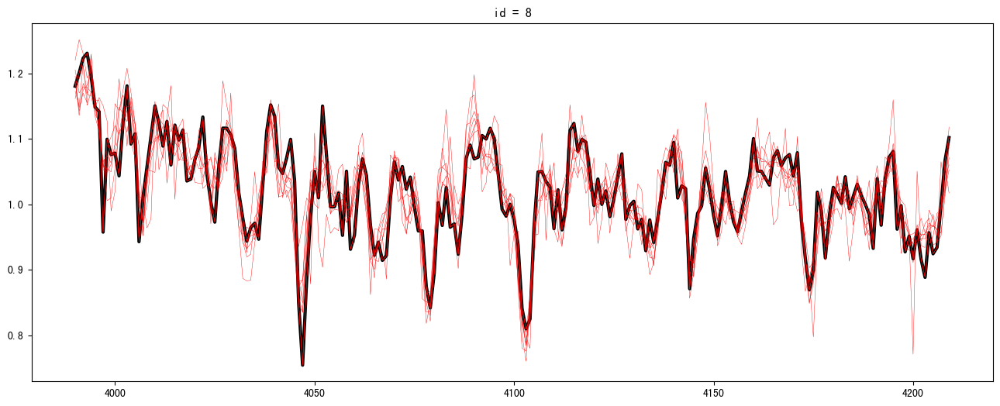

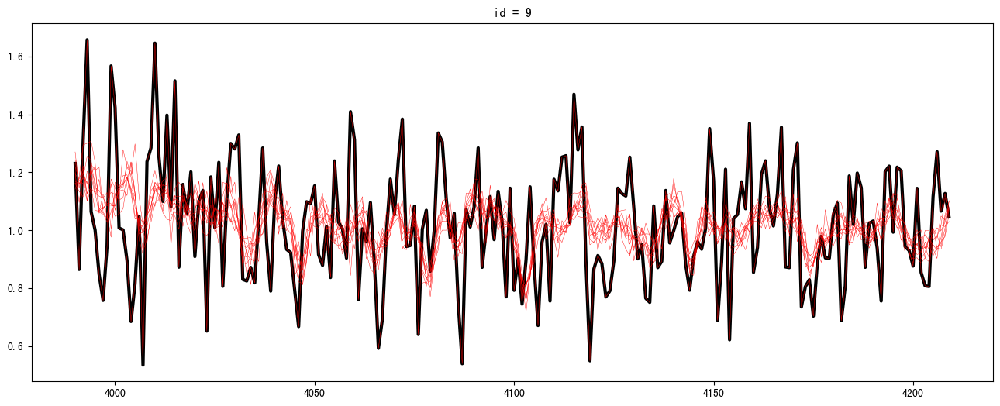

In [177]:
#定义特定波长范围的索引：
i1, i2 = 4040-3800, 4260-3800
distance_to_mean_of_10nbs = []
#计算每个光谱与邻居平均的差异
for nowid in range(len(X)):
    X0, Xnbs = X[nowid][i1:i2], np.array([xx[i1:i2] for xx in X[nbids[nowid]]])
    Xnb_mean = Xnbs.mean(axis=0)
    distance_to_mean_of_10nbs.append( ( (Xnb_mean - X0)**2).sum())
#将距离列表转换为NumPy数组
distance_to_mean_of_10nbs = np.array(distance_to_mean_of_10nbs)
#显示异常光谱及其邻居
def plot_curve_with_10nbs(nowid):
    X0, Xnbs = X[nowid][i1:i2], np.array([xx[i1:i2] for xx in X[nbids[nowid]]])
    if True:
        fig, ax = plt.subplots(figsize=(16,6))
        ax.plot(freqs[i1:i2], X0, lw=3, c='k')#「目标光谱」（核心待分析光谱）
        for xx in Xnbs:
            ax.plot(freqs[i1:i2], xx, lw=0.3, c='r'); ax.set_title('id = '+str(nowid))#「目标光谱的 10 个相似近邻光谱」

#绘制可视化
for nowid in range(10):
    plot_curve_with_10nbs(nowid)
    